# Author: Khursheed Akram

# Import Libraries

In [1]:
import torch
from torchvision import models, transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from PIL import Image
import matplotlib.patches as patches
import requests
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms.functional
import random
import warnings
warnings.filterwarnings('ignore')

# Load Pre-Trained Model

In [2]:
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

# Load Test Image

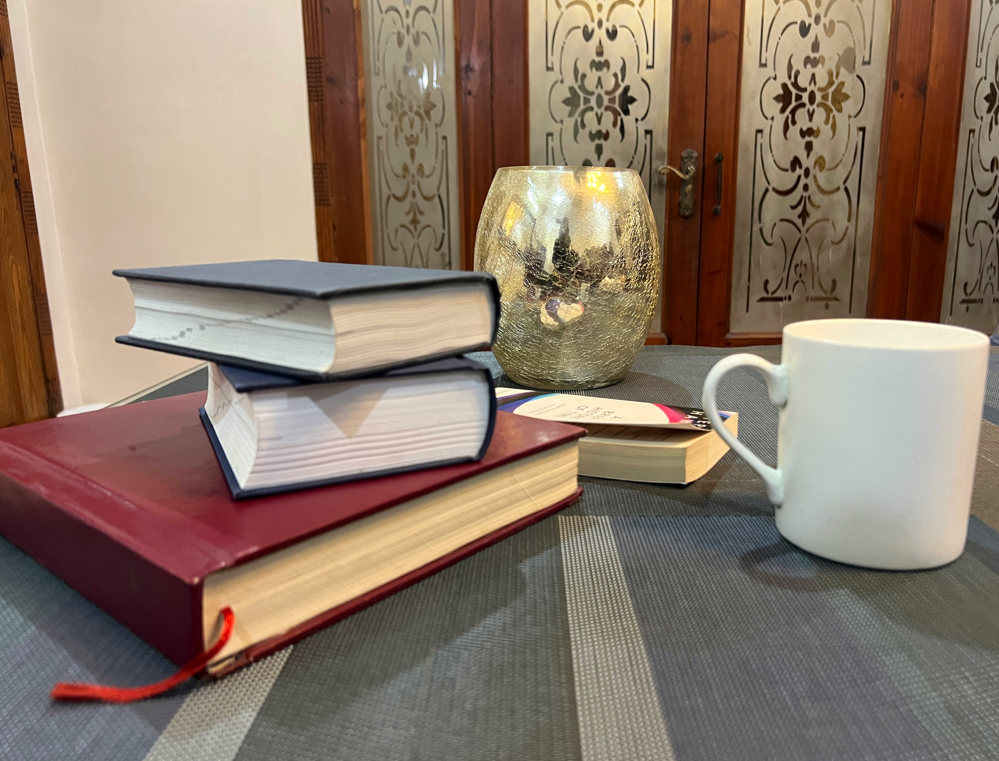

In [3]:
img = Image.open("test.jpg")
img

# Apply the Image Transformations

In [4]:
transform = transforms.Compose([
    transforms.ToTensor(),
])
img_tensor = transform(img).unsqueeze(0)
img_tensor.shape

torch.Size([1, 3, 2939, 3860])

# Perform Object Detection

In [5]:
with torch.no_grad():
    predictions = model(img_tensor)
predictions

[{'boxes': tensor([[2698.3176, 1220.3582, 3821.1162, 2204.4487],
          [ 657.0965, 1445.5079, 1958.7413, 1954.1244],
          [ 440.4891,  989.9424, 1882.8555, 1508.6515],
          [1985.2505, 1525.1449, 2809.8435, 1883.3708],
          [  31.2656, 1473.1151, 2229.9204, 2665.7163],
          [1825.7502,  641.9970, 2559.1780, 1534.4673],
          [   0.0000, 1112.8242, 3860.0000, 2891.6135],
          [2203.0803, 1638.4795, 2804.6184, 1871.1394],
          [1978.6375, 1523.3811, 2754.6770, 1716.0824],
          [ 560.5969, 1380.5514, 2206.6780, 2243.9739],
          [ 413.5630, 1045.8992, 2055.5999, 1869.2041],
          [1841.2567,  659.8850, 2528.9487, 1540.1421],
          [   0.0000,  897.2748, 2711.1663, 2883.9485],
          [2060.8826, 1262.8542, 3860.0000, 2756.4331],
          [ 736.0577, 1405.2726, 1354.5120, 1939.4442],
          [ 807.6249, 1414.8258, 1888.0962, 1761.7848],
          [ 723.0985, 1375.0099, 1884.5793, 1594.1648],
          [1834.5579,  597.9593, 2528.3

# COCO Dataset Class Labels

In [6]:
coco_labels = ['__background__','person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'trafficlight', 'firehydrant', 'streetsign', 'stopsign', 'parkingmeter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'eyeglasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sportsball', 'kite', 'baseballbat', 'baseballglove', 'skateboard', 'surfboard', 'tennisracket', 'bottle', 'plate', 'glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hotdog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'mirror', 'diningtable', 'window', 'desk', 'toilet', 'door', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cellphone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddybear', 'hairdrier', 'toothbrush', 'hairbrush']

# Plot the Results

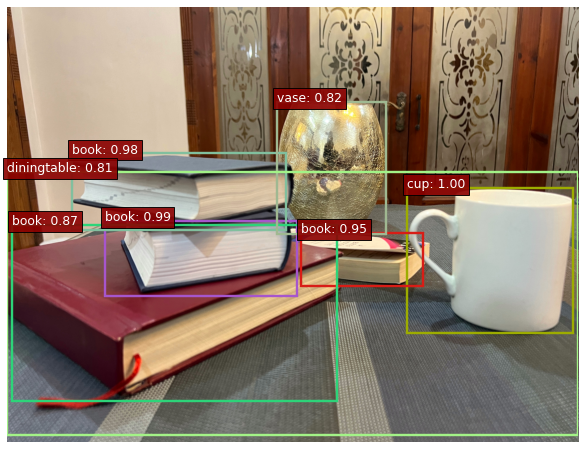

In [9]:
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(img)
for k in range(len(predictions[0]['boxes'])):
    box = predictions[0]['boxes'][k].cpu().numpy()
    score = predictions[0]['scores'][k].cpu().numpy()
    label = predictions[0]['labels'][k].cpu().numpy()
    if label < len(coco_labels):
            label_name = coco_labels[label.item()]
    else:
        label_name = "Unknown"
    threshold = 0.7
    if score > threshold:  
        colors = []
        for rgb in range(len('boxes')):
            colors.append((random.random(), random.random(), random.random()))
        x_min, y_min, x_max, y_max = box
        rec = plt.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=2.4 , fill=False , edgecolor=colors[rgb])
        ax.add_patch(rec)
        plt.text(x_min, y_min, f'{label_name}: {score.item():.2f}', color='white', fontsize=12.4, bbox=dict(facecolor='darkred', alpha=0.9))
plt.axis('off')
plt.show()